In [1]:
from __future__ import print_function
from __future__ import division
import torch
import random
import torchvision.transforms as T
import numpy as np
from scipy.ndimage.filters import gaussian_filter1d
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import random_split
import matplotlib.pyplot as plt
import time
import os
import copy
from PIL import Image
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  1.8.1+cu111
Torchvision Version:  0.9.1+cu111


In [2]:
# sourced from 231n network visualization
def compute_saliency_maps(X, y, model):
    """
    Compute a class saliency map using the model for images X and labels y.

    Input:
    - X: Input images; Tensor of shape (N, 3, H, W)
    - y: Labels for X; LongTensor of shape (N,)
    - model: A pretrained CNN that will be used to compute the saliency map.

    Returns:
    - saliency: A Tensor of shape (N, H, W) giving the saliency maps for the input
    images.
    """
    # Make sure the model is in "test" mode
    model.eval()

    # Make input tensor require gradient
    X.requires_grad_()

    saliency = None
    # forward pass
    class_scores = model(X).gather(1, y.view(-1, 1)).squeeze()
    print("class scores shape:", class_scores.shape)
    loss = torch.sum(class_scores)

    # backward pass
    loss.backward()
    saliency = X.grad
    saliency = saliency.abs()
    saliency, _ = torch.max(saliency, dim=1)
    return saliency

In [3]:
def show_saliency_maps(X, y, model, transform):
    # Convert X and y from numpy arrays to Torch Tensors
    image_conversion = T.ToPILImage()
    #X_tensor = torch.cat([transform(image_conversion(x)) for x in X], dim=0)
    #y_tensor = torch.LongTensor(y)
    
    X_tensor, y_tensor = transform(X.to(device)), y.to(device)
    
    # Compute saliency maps for images in X
    saliency = compute_saliency_maps(X_tensor, y_tensor, model)
    
    # compute predictions
    scores = model(X_tensor)
    _, preds = torch.max(scores, dim=1)

    # Convert the saliency map from Torch Tensor to numpy array and show images
    # and saliency maps together.
    saliency = saliency.cpu().numpy()
    N = X.shape[0]
    for i in range(N):
        plt.subplot(2, N, i + 1)
        img_tensor = image_conversion(X[i])
        plt.imshow(img_tensor)
        plt.axis('off')
        plt.title(f"predicted class: {preds[i]}, ground truth: {y_tensor[i]}")
        plt.subplot(2, N, N + i + 1)
        plt.imshow(saliency[i], cmap=plt.cm.hot)
        plt.axis('off')
        plt.gcf().set_size_inches(12, 5)
    plt.show()

In [4]:
resnet_path = "saved-models/resnet/resnet.pth"
densenet_path = "saved-models/densenet/densenet.pth"
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [8]:
num_classes = 2
use_pretrained = True
resnet_model = models.resnet18(pretrained=use_pretrained).to(device)
num_ftrs = resnet_model.fc.in_features
resnet_model.fc = nn.Linear(num_ftrs, num_classes).to(device)

In [9]:
densenet_model = models.densenet121(pretrained=use_pretrained).to(device)
num_ftrs = densenet_model.classifier.in_features
densenet_model.classifier = nn.Linear(num_ftrs, num_classes).to(device)

In [10]:
resnet_model.load_state_dict(torch.load(resnet_path, map_location=device))
densenet_model.load_state_dict(torch.load(densenet_path, map_location=device))

<All keys matched successfully>

In [15]:
# copied over from resnet-densenet
model_name = "resnet"
num_classes = 2
batch_size = 1
num_epochs = 15
feature_extract = True
data_dir = "train-val/Training"
test_dir = "test/Test"
percent_val = 0.1
save_path = "saved-models"
input_size = 224

In [16]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(input_size),
        transforms.ToTensor(),
        #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(input_size),
        transforms.ToTensor(),
        #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test':transforms.Compose([
        transforms.Resize(input_size),
        transforms.ToTensor(),
        #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

normalization_transform = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

In [17]:
train_folder = "../train-val/Training/"
test_folder = "../test/Test/"
import torch.utils.data as data
from torchvision import datasets
from datasets import load_dataset
image_datasets = {}
orig_set = datasets.ImageFolder(train_folder)
n = len(orig_set)
n_val = int(percent_val * n)
train_dataset, val_dataset = random_split(orig_set, [n-n_val, n_val])
val_dataset.dataset.transform = data_transforms["val"]
train_dataset.dataset.transform = data_transforms["train"]
image_datasets["val"] = val_dataset
image_datasets["train"] = train_dataset
image_datasets["test"] = datasets.ImageFolder(test_folder, data_transforms["test"])
dataloaders_dict = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=4) for x in ['train', 'val', 'test']}
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

class scores shape: torch.Size([])


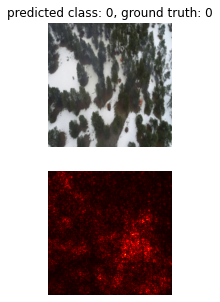

class scores shape: torch.Size([])


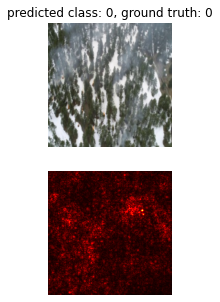

class scores shape: torch.Size([])


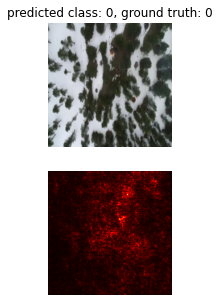

class scores shape: torch.Size([])


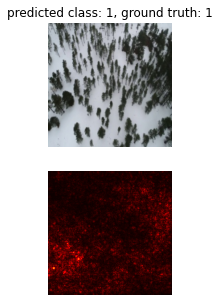

class scores shape: torch.Size([])


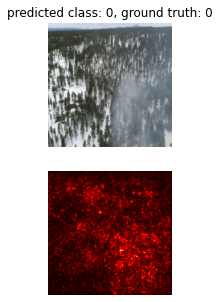

class scores shape: torch.Size([])


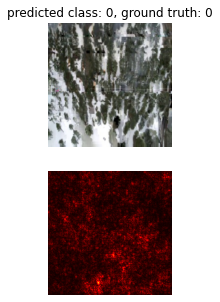

class scores shape: torch.Size([])


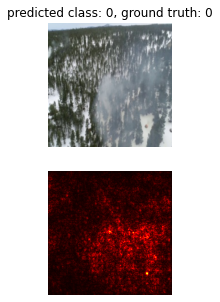

class scores shape: torch.Size([])


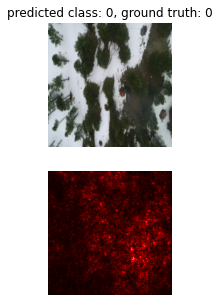

class scores shape: torch.Size([])


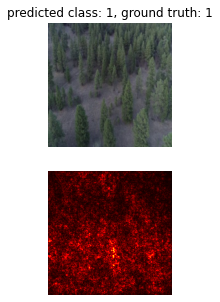

class scores shape: torch.Size([])


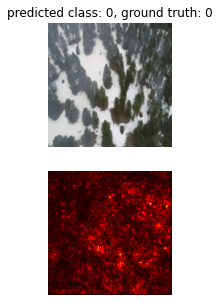

class scores shape: torch.Size([])


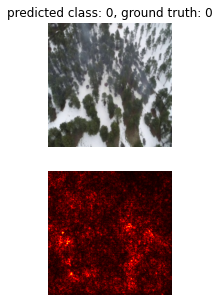

class scores shape: torch.Size([])


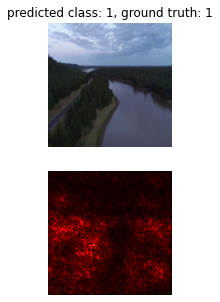

class scores shape: torch.Size([])


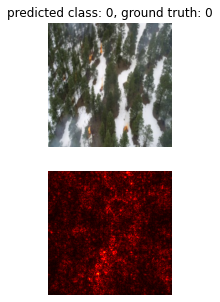

class scores shape: torch.Size([])


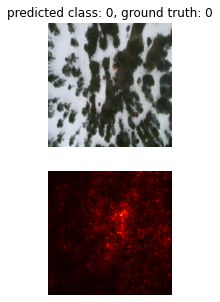

class scores shape: torch.Size([])


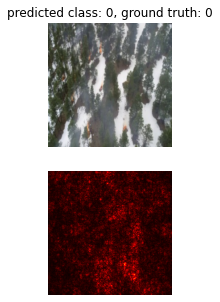

class scores shape: torch.Size([])


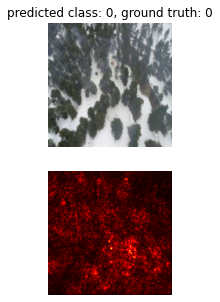

class scores shape: torch.Size([])


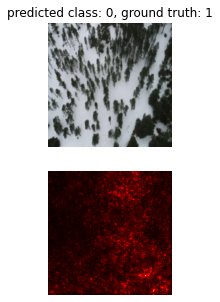

class scores shape: torch.Size([])


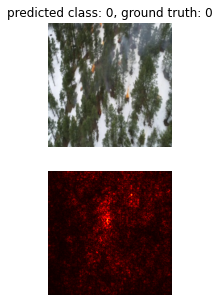

class scores shape: torch.Size([])


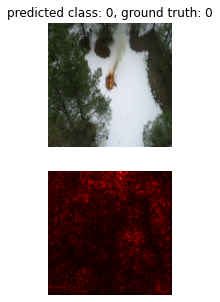

class scores shape: torch.Size([])


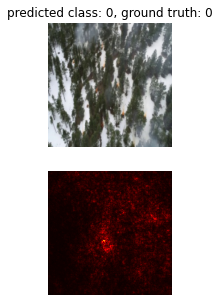

class scores shape: torch.Size([])


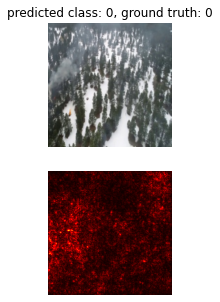

class scores shape: torch.Size([])


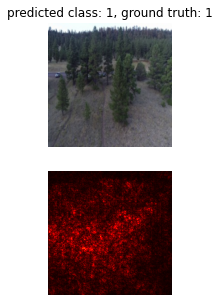

class scores shape: torch.Size([])


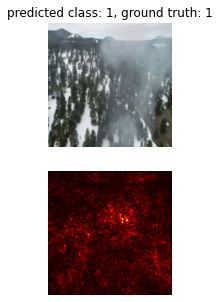

class scores shape: torch.Size([])


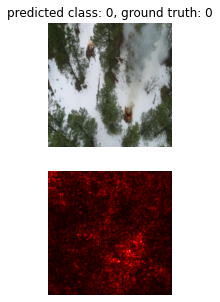

class scores shape: torch.Size([])


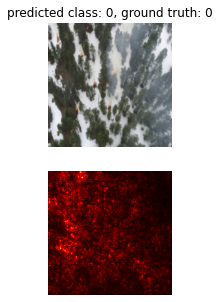

class scores shape: torch.Size([])


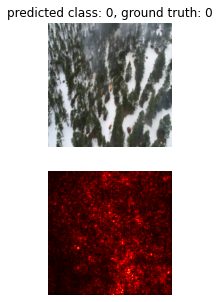

class scores shape: torch.Size([])


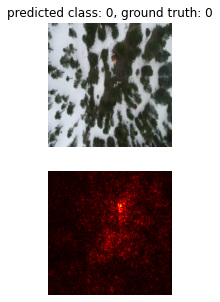

class scores shape: torch.Size([])


KeyboardInterrupt: 

In [18]:
for X, y in dataloaders_dict["val"]:
    show_saliency_maps(X, y, resnet_model, normalization_transform)

class scores shape: torch.Size([])


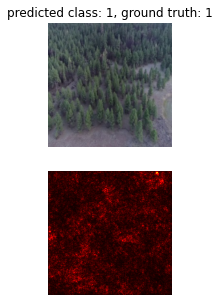

class scores shape: torch.Size([])


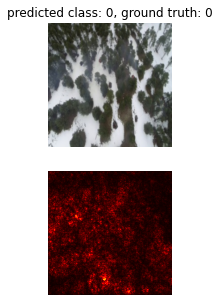

class scores shape: torch.Size([])


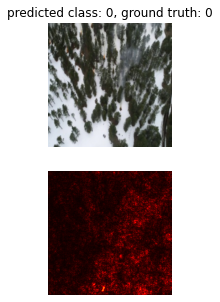

class scores shape: torch.Size([])


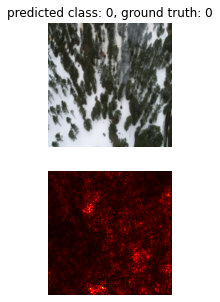

class scores shape: torch.Size([])


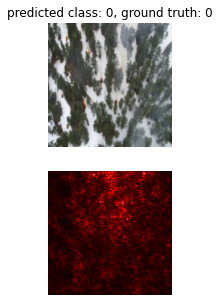

class scores shape: torch.Size([])


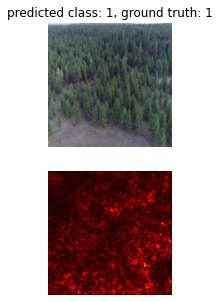

class scores shape: torch.Size([])


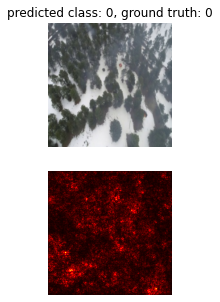

class scores shape: torch.Size([])


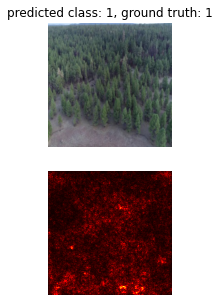

class scores shape: torch.Size([])


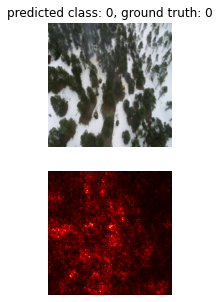

class scores shape: torch.Size([])


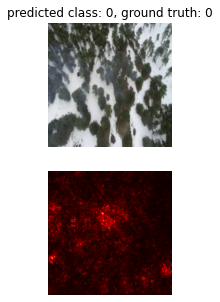

class scores shape: torch.Size([])


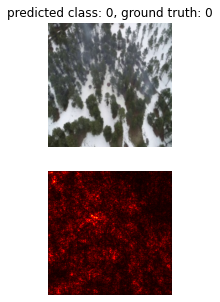

class scores shape: torch.Size([])


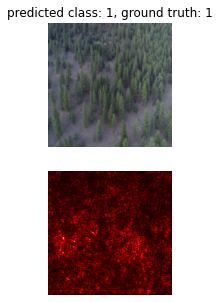

class scores shape: torch.Size([])


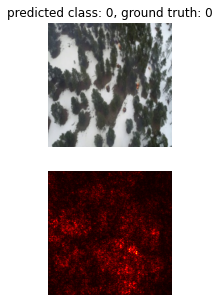

class scores shape: torch.Size([])


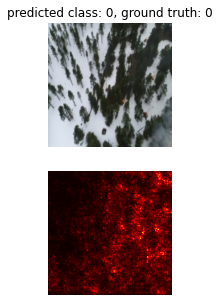

class scores shape: torch.Size([])


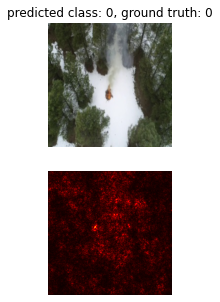

class scores shape: torch.Size([])


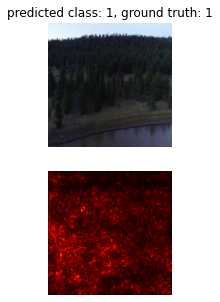

class scores shape: torch.Size([])


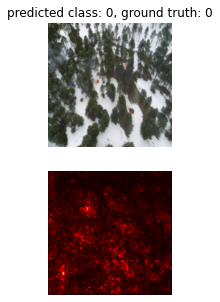

class scores shape: torch.Size([])


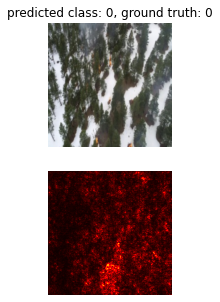

class scores shape: torch.Size([])


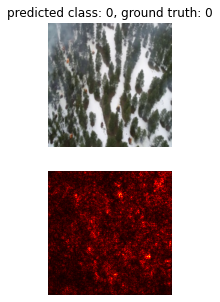

class scores shape: torch.Size([])


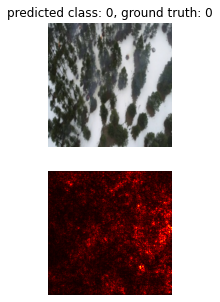

class scores shape: torch.Size([])


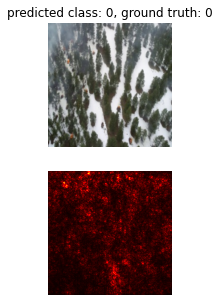

class scores shape: torch.Size([])


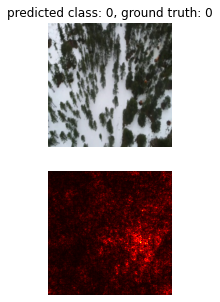

class scores shape: torch.Size([])


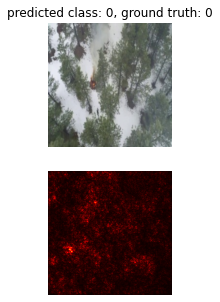

class scores shape: torch.Size([])


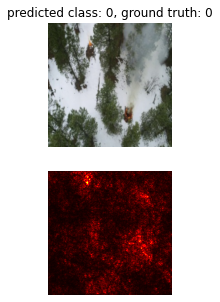

class scores shape: torch.Size([])


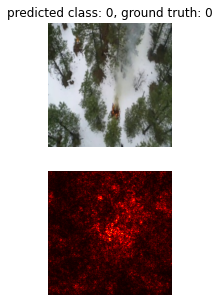

class scores shape: torch.Size([])


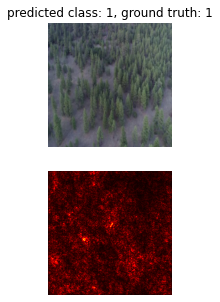

class scores shape: torch.Size([])


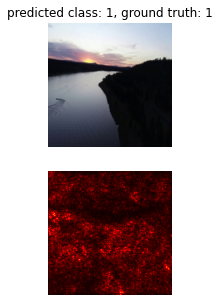

class scores shape: torch.Size([])


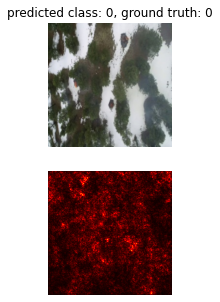

class scores shape: torch.Size([])


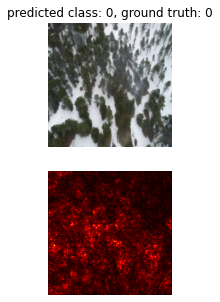

class scores shape: torch.Size([])


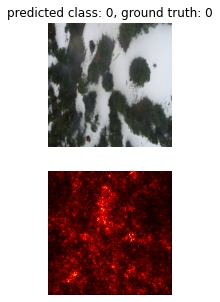

class scores shape: torch.Size([])


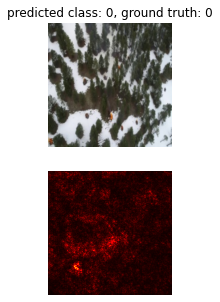

class scores shape: torch.Size([])


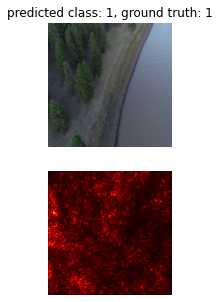

class scores shape: torch.Size([])


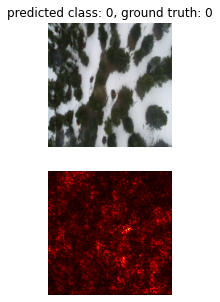

class scores shape: torch.Size([])


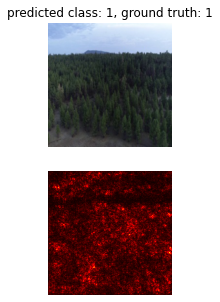

class scores shape: torch.Size([])


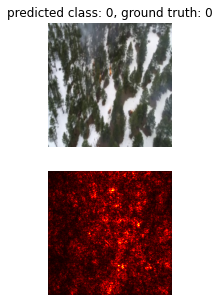

class scores shape: torch.Size([])


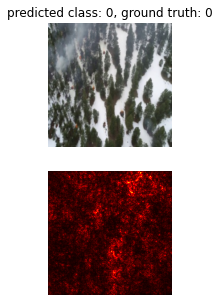

class scores shape: torch.Size([])


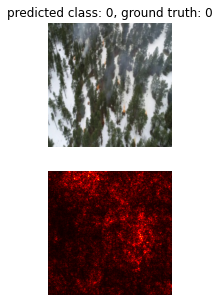

class scores shape: torch.Size([])


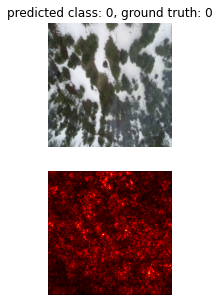

class scores shape: torch.Size([])


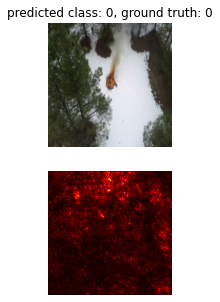

class scores shape: torch.Size([])


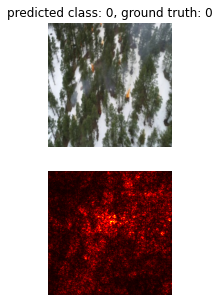

class scores shape: torch.Size([])


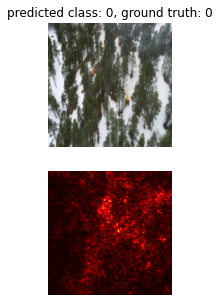

class scores shape: torch.Size([])


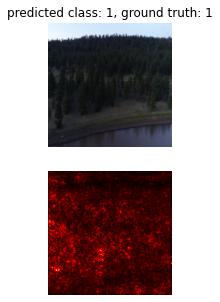

class scores shape: torch.Size([])


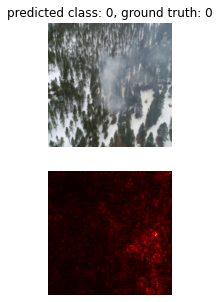

class scores shape: torch.Size([])


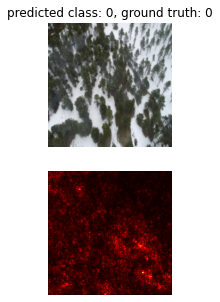

class scores shape: torch.Size([])


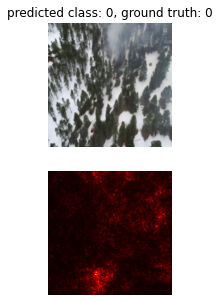

class scores shape: torch.Size([])


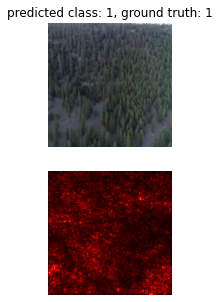

class scores shape: torch.Size([])


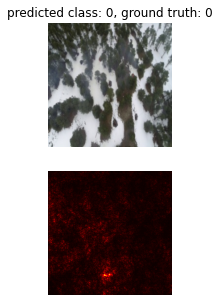

class scores shape: torch.Size([])


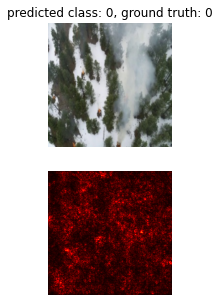

class scores shape: torch.Size([])


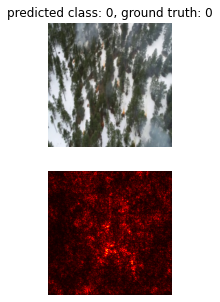

class scores shape: torch.Size([])


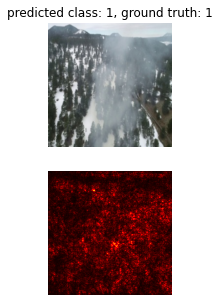

class scores shape: torch.Size([])


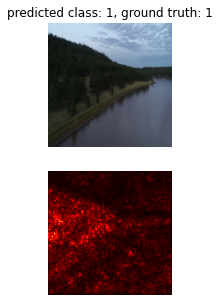

class scores shape: torch.Size([])


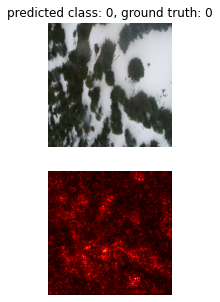

class scores shape: torch.Size([])


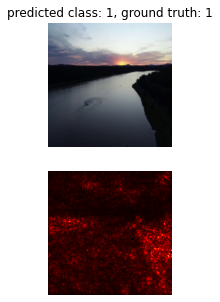

class scores shape: torch.Size([])


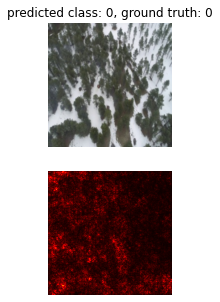

class scores shape: torch.Size([])


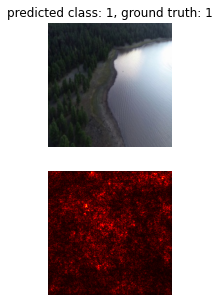

class scores shape: torch.Size([])


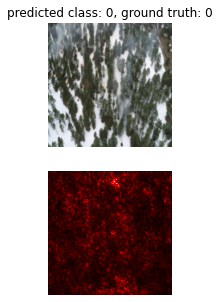

class scores shape: torch.Size([])


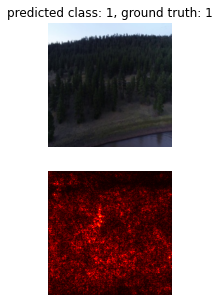

class scores shape: torch.Size([])


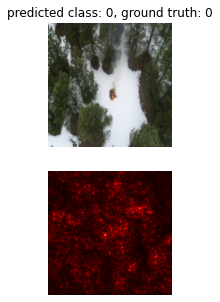

class scores shape: torch.Size([])


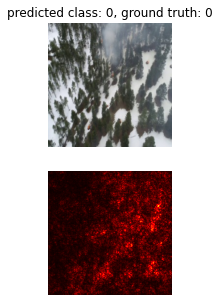

class scores shape: torch.Size([])


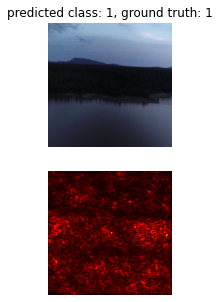

class scores shape: torch.Size([])


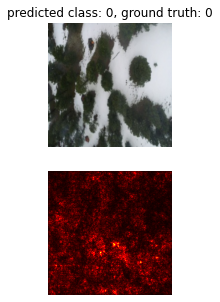

class scores shape: torch.Size([])


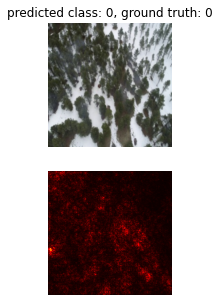

class scores shape: torch.Size([])


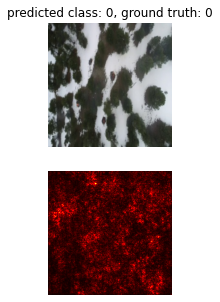

class scores shape: torch.Size([])


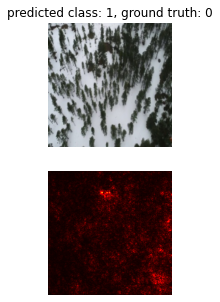

class scores shape: torch.Size([])


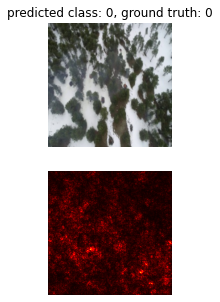

class scores shape: torch.Size([])


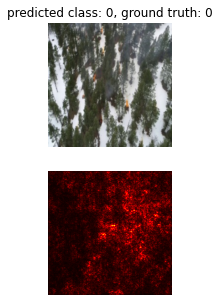

class scores shape: torch.Size([])


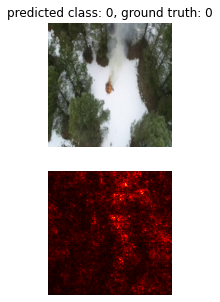

class scores shape: torch.Size([])


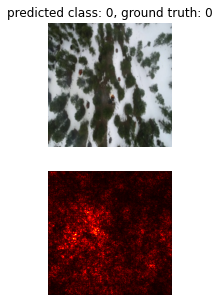

class scores shape: torch.Size([])


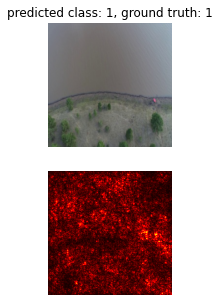

class scores shape: torch.Size([])


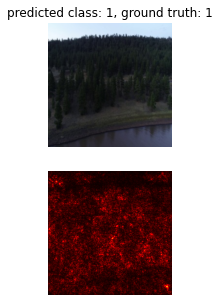

class scores shape: torch.Size([])


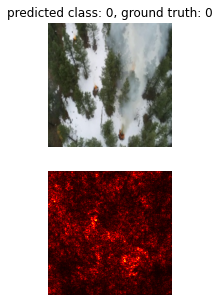

class scores shape: torch.Size([])


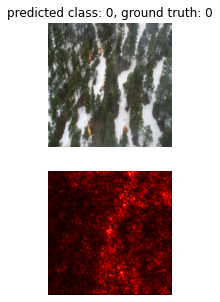

class scores shape: torch.Size([])


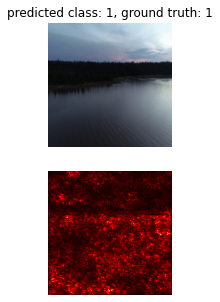

class scores shape: torch.Size([])


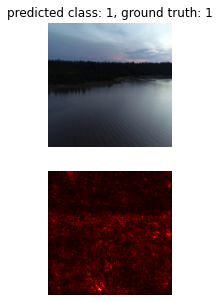

class scores shape: torch.Size([])


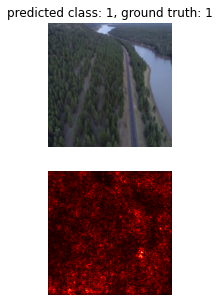

class scores shape: torch.Size([])


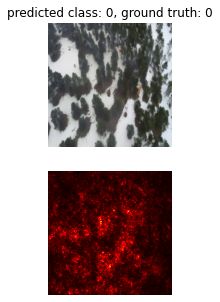

class scores shape: torch.Size([])


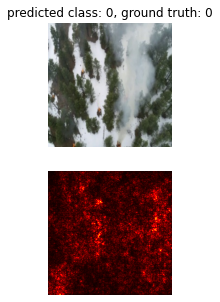

class scores shape: torch.Size([])


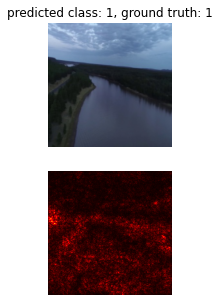

class scores shape: torch.Size([])


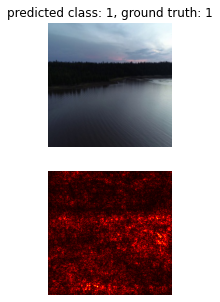

class scores shape: torch.Size([])


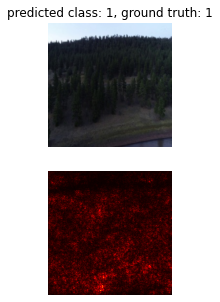

class scores shape: torch.Size([])


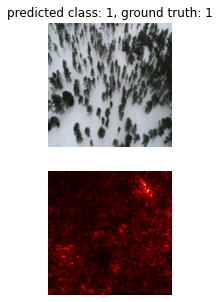

class scores shape: torch.Size([])


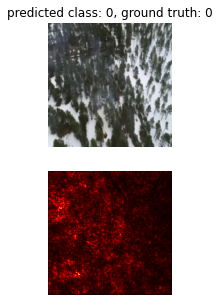

class scores shape: torch.Size([])


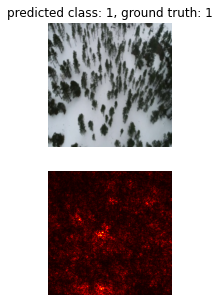

class scores shape: torch.Size([])


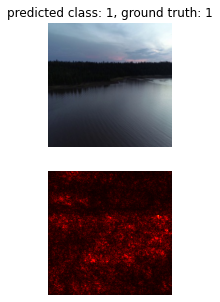

class scores shape: torch.Size([])


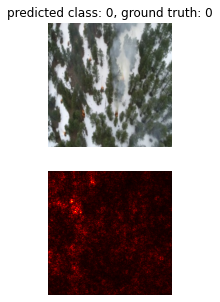

class scores shape: torch.Size([])


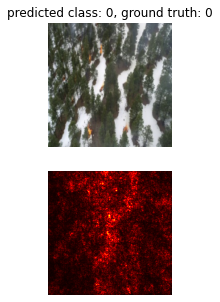

class scores shape: torch.Size([])


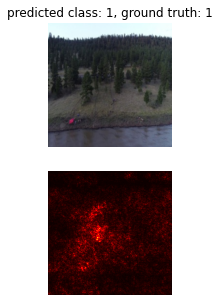

class scores shape: torch.Size([])


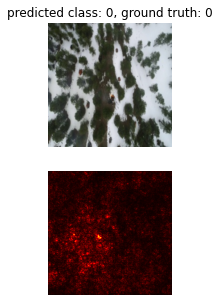

class scores shape: torch.Size([])


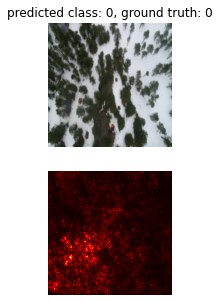

class scores shape: torch.Size([])


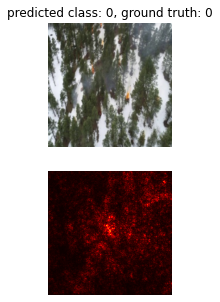

class scores shape: torch.Size([])


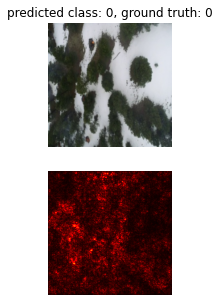

class scores shape: torch.Size([])


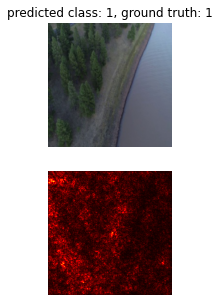

class scores shape: torch.Size([])


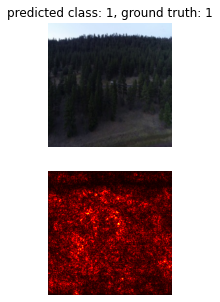

class scores shape: torch.Size([])


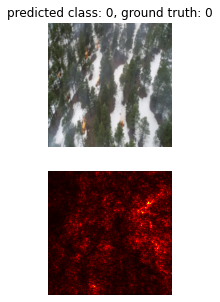

class scores shape: torch.Size([])


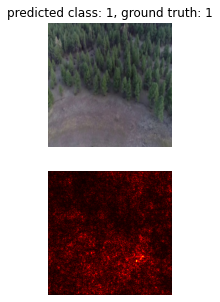

class scores shape: torch.Size([])


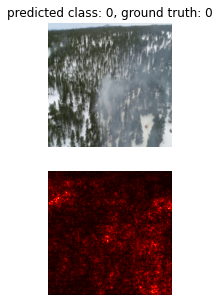

class scores shape: torch.Size([])


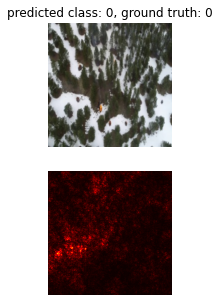

class scores shape: torch.Size([])


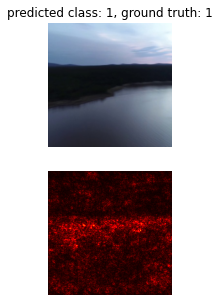

class scores shape: torch.Size([])


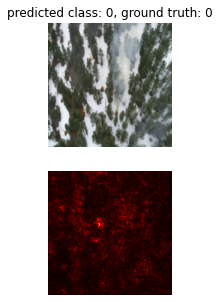

class scores shape: torch.Size([])


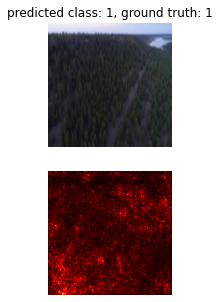

class scores shape: torch.Size([])


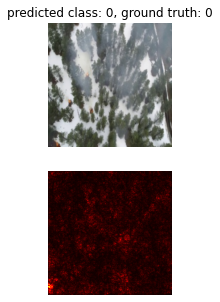

class scores shape: torch.Size([])


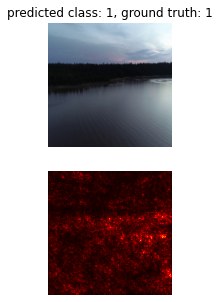

class scores shape: torch.Size([])


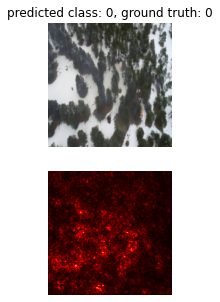

class scores shape: torch.Size([])


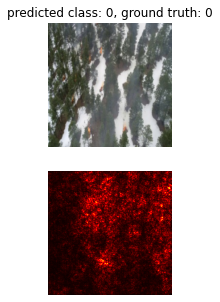

class scores shape: torch.Size([])


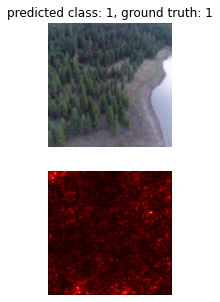

class scores shape: torch.Size([])


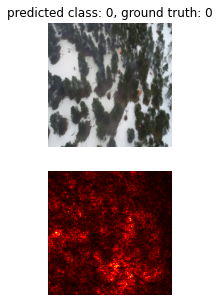

class scores shape: torch.Size([])


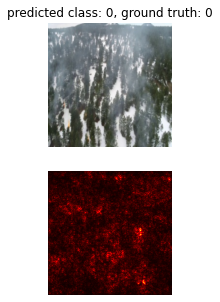

class scores shape: torch.Size([])


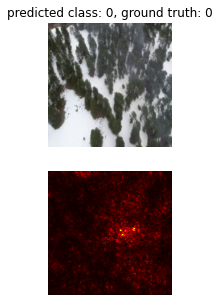

class scores shape: torch.Size([])


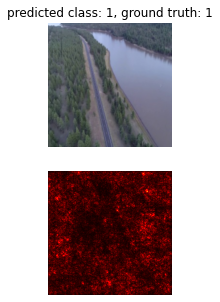

class scores shape: torch.Size([])


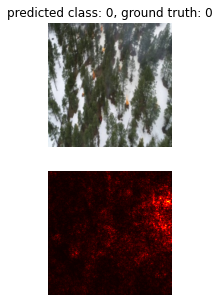

class scores shape: torch.Size([])


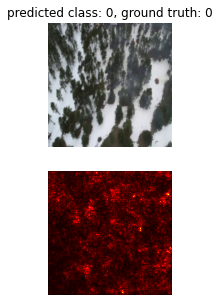

class scores shape: torch.Size([])


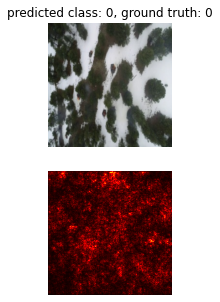

class scores shape: torch.Size([])


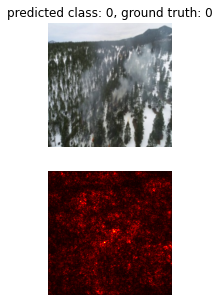

class scores shape: torch.Size([])


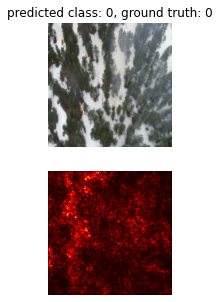

class scores shape: torch.Size([])


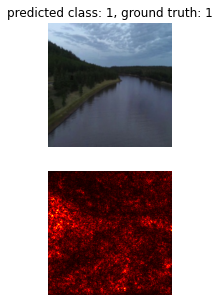

class scores shape: torch.Size([])


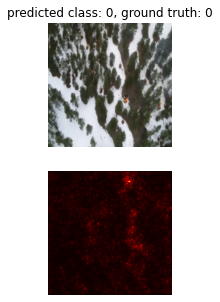

class scores shape: torch.Size([])


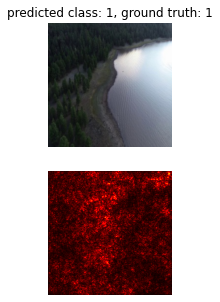

class scores shape: torch.Size([])


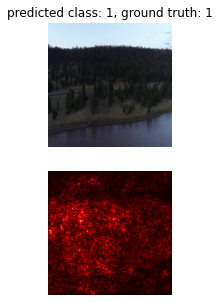

class scores shape: torch.Size([])


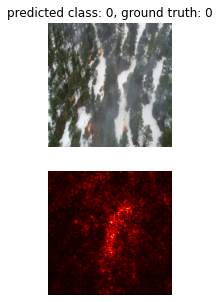

class scores shape: torch.Size([])


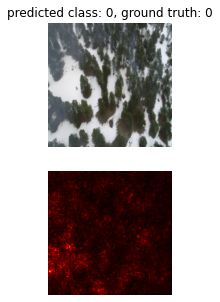

class scores shape: torch.Size([])


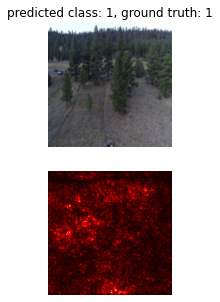

class scores shape: torch.Size([])


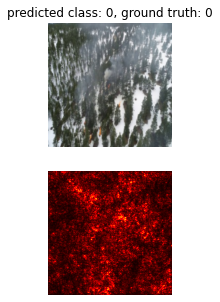

class scores shape: torch.Size([])


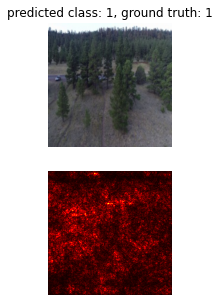

class scores shape: torch.Size([])


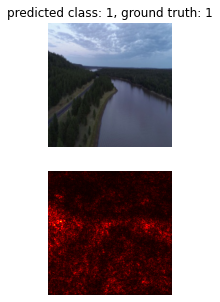

class scores shape: torch.Size([])


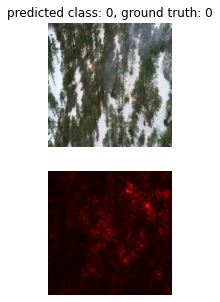

class scores shape: torch.Size([])


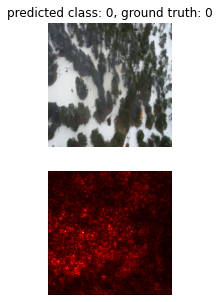

class scores shape: torch.Size([])


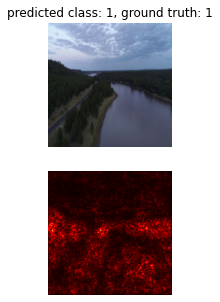

class scores shape: torch.Size([])


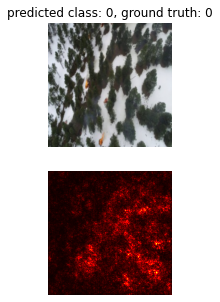

class scores shape: torch.Size([])


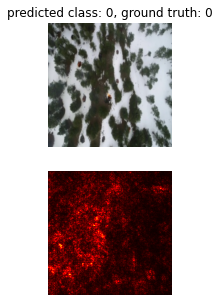

class scores shape: torch.Size([])


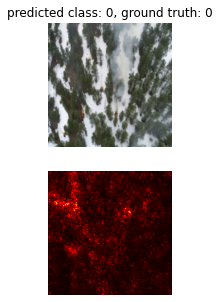

class scores shape: torch.Size([])


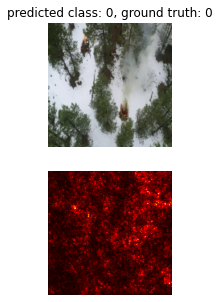

class scores shape: torch.Size([])


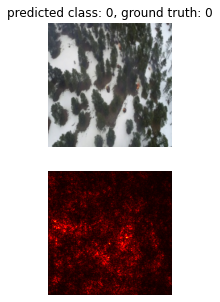

class scores shape: torch.Size([])


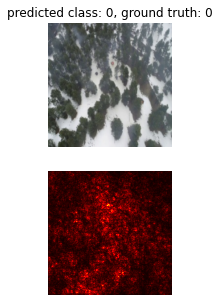

class scores shape: torch.Size([])


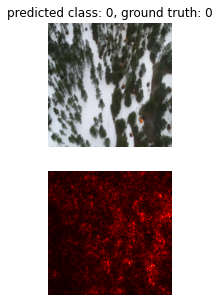

class scores shape: torch.Size([])


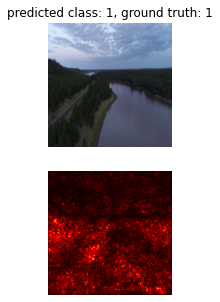

class scores shape: torch.Size([])


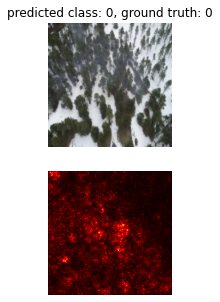

class scores shape: torch.Size([])


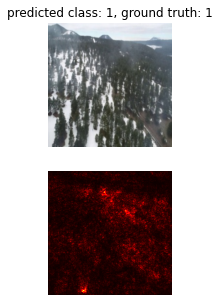

class scores shape: torch.Size([])


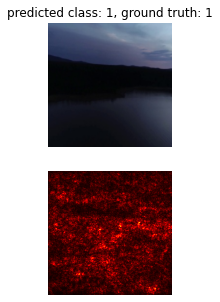

class scores shape: torch.Size([])


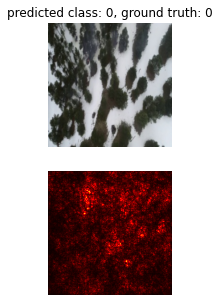

class scores shape: torch.Size([])


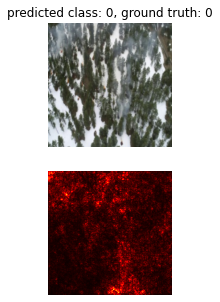

class scores shape: torch.Size([])


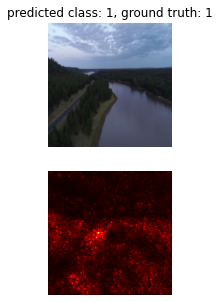

class scores shape: torch.Size([])


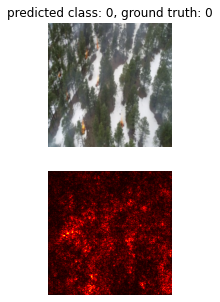

class scores shape: torch.Size([])


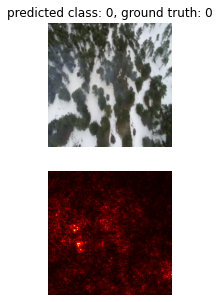

class scores shape: torch.Size([])


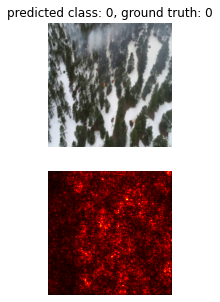

class scores shape: torch.Size([])


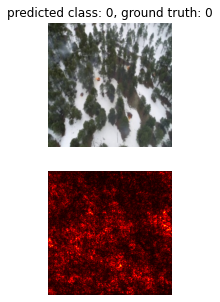

class scores shape: torch.Size([])


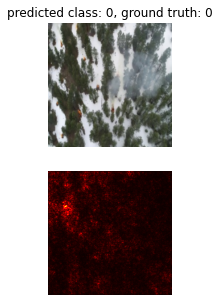

class scores shape: torch.Size([])


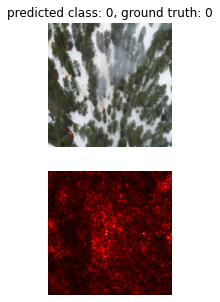

class scores shape: torch.Size([])


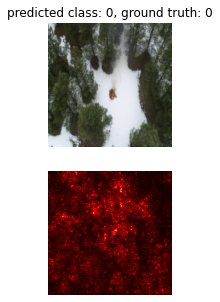

class scores shape: torch.Size([])


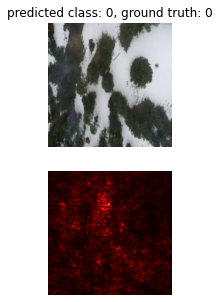

class scores shape: torch.Size([])


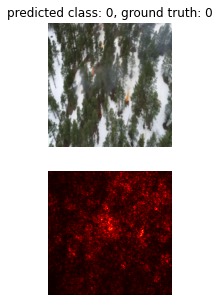

class scores shape: torch.Size([])


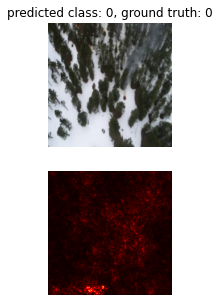

class scores shape: torch.Size([])


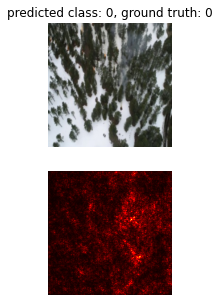

class scores shape: torch.Size([])


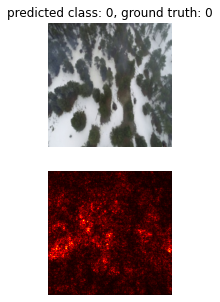

class scores shape: torch.Size([])


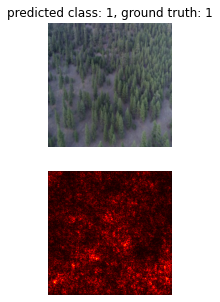

class scores shape: torch.Size([])


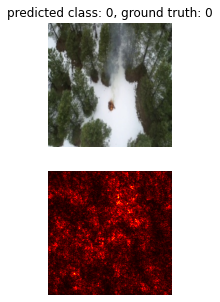

class scores shape: torch.Size([])


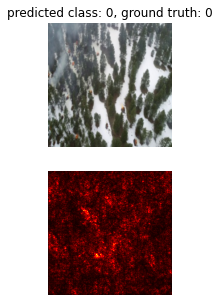

class scores shape: torch.Size([])


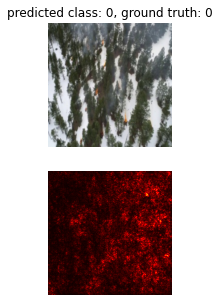

class scores shape: torch.Size([])


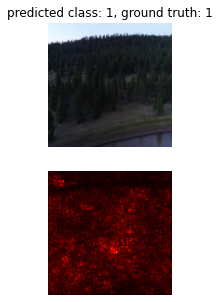

class scores shape: torch.Size([])


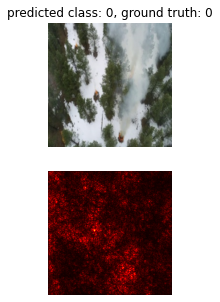

class scores shape: torch.Size([])


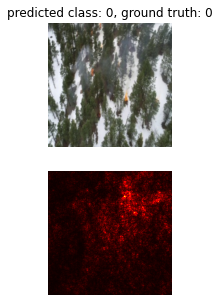

class scores shape: torch.Size([])


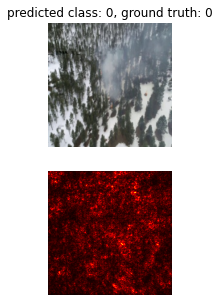

class scores shape: torch.Size([])


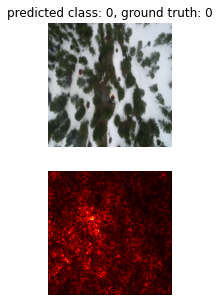

class scores shape: torch.Size([])


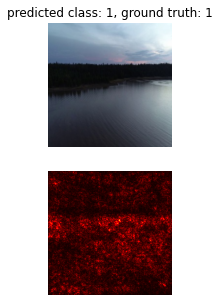

class scores shape: torch.Size([])


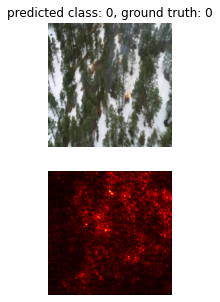

class scores shape: torch.Size([])


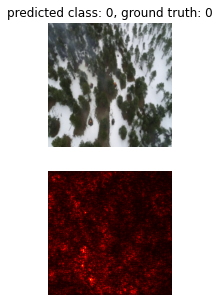

class scores shape: torch.Size([])


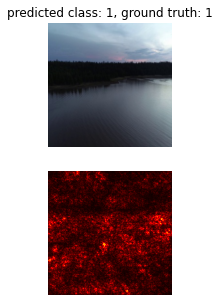

class scores shape: torch.Size([])


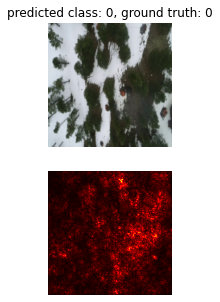

class scores shape: torch.Size([])


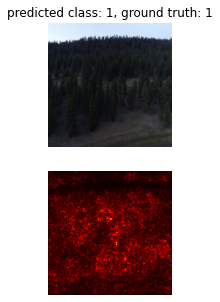

class scores shape: torch.Size([])


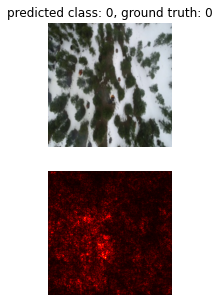

class scores shape: torch.Size([])


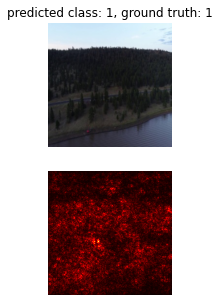

class scores shape: torch.Size([])


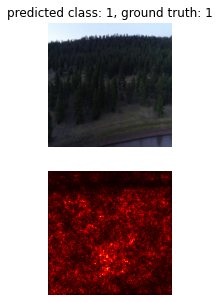

class scores shape: torch.Size([])


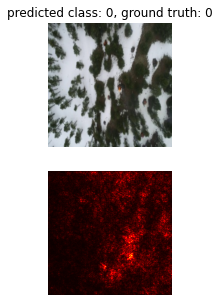

class scores shape: torch.Size([])


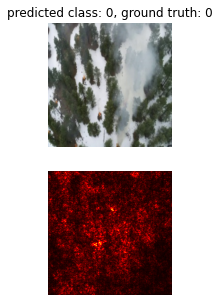

class scores shape: torch.Size([])


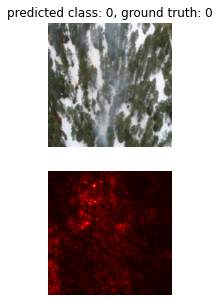

class scores shape: torch.Size([])


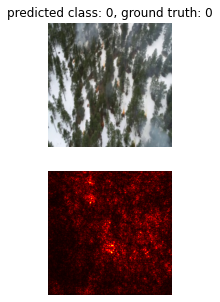

class scores shape: torch.Size([])


KeyboardInterrupt: 

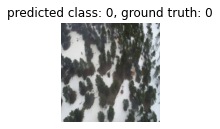

In [19]:
for X, y in dataloaders_dict["val"]:
    show_saliency_maps(X, y, densenet_model, normalization_transform)